Для начала загрузим данные и проверим их полноту:

In [2]:
import pandas as pd
uiks = pd.read_csv('/Users/blssd/Downloads/duma-master/data/edata.csv', index_col=0)

In [3]:
uiks

,name,region,kprf,er,voted,total_voters,lat,lon
0,УИК №592,Алтайский край,57,49,178,385,51.885025,85.307478
1,УИК №593,Алтайский край,189,174,569,1515,51.934707,85.326494
2,УИК №594,Алтайский край,157,141,464,1175,51.930130,85.333621
3,УИК №595,Алтайский край,303,339,962,2257,51.943233,85.336853
4,УИК №596,Алтайский край,264,282,843,1924,51.961639,85.335227
...,...,...,...,...,...,...,...,...
96302,УИК №187,город Севастополь,261,791,1586,2286,44.773268,33.544332
96303,УИК №188,город Севастополь,111,431,905,1589,44.773268,33.544332
96304,УИК №189,город Севастополь,112,306,634,1333,44.815350,33.560437
96305,УИК №190,город Севастополь,145,346,660,1235,44.786191,33.616072


Подсчитаем итоговый результат выборов для партии КПРФ и Единая Россия:

In [4]:
# Итоговый результат КПРФ
kprf = uiks['kprf'].sum() / uiks['voted'].sum()
print(f'Итоговый результат КПРФ: {kprf}')

print('\n')

# Итоговый результат Единой России
er = uiks['er'].sum() / uiks['voted'].sum()
print(f'Итоговый результат Единой России: {er}')

Итоговый результат КПРФ: 0.18925488494610923


Итоговый результат Единой России: 0.4982132868119814


Итоговый результат совпадает с результатом на сайте ЦИК, будем считать данные полными.
Как видно из результатов ЦИК, Единая Россия опередила КПРФ более чем в два раза. Однако есть регионы, где КПРФ одержала победу. Для каждого из участков добавим параметр 'k-e' , который равен разнице результата Единой России и КПРФ в регионе, в котором находится участок. Кроме того, создадим таблицу с регионами, где победу одержала КПРФ:

In [5]:
uiks['k-e'] = 0.0
regions = uiks['region'].drop_duplicates()
reg = pd.DataFrame()
for region in regions:
    region_data = uiks[uiks['region'] == region]
    voted = region_data['voted'].sum()
    kprf_total = region_data['kprf'].sum()
    kprf_percent = kprf_total / voted
    er_total = region_data['er'].sum()
    er_percent = er_total / voted
    uiks.loc[uiks['region'] == region, 'k-e'] = kprf_percent - er_percent
    uiks.loc[uiks['region'] == region, 'color'] = 'blue' if er_total > kprf_total else 'red'
    reg = reg.append(pd.DataFrame({'name':region, 'kprf':[kprf_total], 'kprf_percent':[kprf_percent], 'er':[er_total], 'er_percent':[er_percent]}), ignore_index=True)

In [6]:
reg[reg['kprf'] > reg['er']]

,name,kprf,kprf_percent,er,er_percent
31,Ненецкий автономный округ,4917,0.319763,4469,0.290629
52,Республика Марий Эл,89018,0.362999,81969,0.334255
54,Республика Саха (Якутия),118683,0.351483,112160,0.332165
74,Хабаровский край,113691,0.265075,105112,0.245072


Нанесем участки на карту России с помощью библиотеки plotly.express.

In [17]:
import plotly.express as px
fig = px.scatter_mapbox(uiks, #наш датасет
                        lat="lat",
                        lon="lon",
                        color = "k-e",
                        range_color=(-0.5, 0.5),
                        zoom=2,
                        width=1200, height=800,
                        center={'lat':60, 'lon':105},
                        title='По данным ЦИК')
fig.update_layout(mapbox_style='open-street-map')
fig.update_traces(marker=dict(size=5))
fig.show(config={'scrollZoom': True})

На этой карте участки окрашены в различные цвета, в соответствии с разницей результата КПРФ и Единой России по региону, в котором находится участок(параметр ‘k-e’). Цвет может меняться от темно синего (Результат Единой России на 50% и более выше, чем у КПРФ) до желтого(результат КПРФ на 50% выше, чем у Единой России). На карте преобладают холодные тона. Преимущество Единой России очевидно.

Построим теперь график зависимости результатов Единой России и КПРФ от явки c помощью matplotlib:

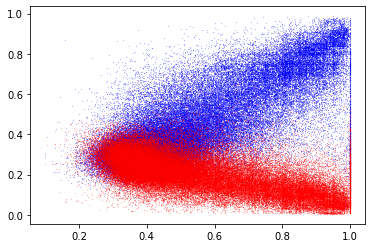

In [10]:
import matplotlib.pyplot as plt
uiks = uiks[uiks['kprf'] > 10]
uiks = uiks[uiks['er'] > 10]
uiks['er_percent'] = uiks['er'] / uiks['voted']
uiks['kprf_percent'] = uiks['kprf'] / uiks['voted']
uiks['turnout'] = uiks['voted'] / uiks['total_voters']
plt.scatter(uiks['turnout'], uiks['er_percent'], color='blue', s=0.01)
plt.scatter(uiks['turnout'], uiks['kprf_percent'], color='red', s=0.01)
plt.show()

На графике можно выделить две характерные зоны. Плотное ядро в районе явок 0.2-0.6 и расходящиеся «хвосты» в районе явок свыше 0.6. В своих работах, независимые электоральные аналитики показывают, что подобная картина может наблюдаться при вбросе голосов за партию, результат которой растет с явкой. Причем в ядре находятся участки с «нормальной явкой», на которых не было фальсификаций, а хвосты соответствуют участкам с «аномальной явкой», где результаты выборов недостоверны.

Отделим участки с нормальным голосованием от участков с аномальным голосованием.

Чтобы выделить участки в ядре используем алгоритм DBSCAN(Density Based Scan) из библиотеки scikit-learn. Этот алгоритм выделяет кластеры, в которых для каждой точки в радиусе “eps” имеется количество точек равное “min_samples”. Хороший результат дает eps = 0.009 и min_samples = 175:

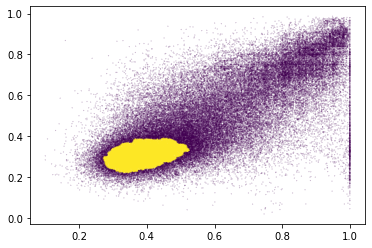

In [11]:
from sklearn.cluster import DBSCAN
er = uiks[['turnout', 'er_percent']]
er = er.to_numpy()
db = DBSCAN(eps=0.009, min_samples=175).fit(er)
plt.scatter(er[:, 0], er[:,1], c=db.labels_, s=0.01)
plt.show()
uiks['db'] = db.labels_
uiks_normal = uiks[uiks['db'] == 0]
uiks_anomaly = uiks[uiks['db'] != 0]

Далее будем использовать участки из ядра для того, чтобы обучить модель. В качестве алгоритма будем использовать алгоритм k ближайших соседей. В sklearn он реализован в виде класса KNeighborsRegressor. Кроме того, мы создадим объект класса Pipeline, чтобы автоматически нормализовать данные с помощью StandardScaler.

In [12]:
#%% Создаем pipeline для модели машинного обучения

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor

pipe = Pipeline([("scale", StandardScaler()), ("model", KNeighborsRegressor())])
pipe.get_params()

{'memory': None,
 'steps': [('scale', StandardScaler()), ('model', KNeighborsRegressor())],
 'verbose': False,
 'scale': StandardScaler(),
 'model': KNeighborsRegressor(),
 'scale__copy': True,
 'scale__with_mean': True,
 'scale__with_std': True,
 'model__algorithm': 'auto',
 'model__leaf_size': 30,
 'model__metric': 'minkowski',
 'model__metric_params': None,
 'model__n_jobs': None,
 'model__n_neighbors': 5,
 'model__p': 2,
 'model__weights': 'uniform'}

Для обучения модели мы разделим участки в ядре на три части(cv = 3) и проведем оптимизацию результатов по количеству ближайших соседей ('model__n_neighbors'):

In [18]:
#%% Задаем параметры кросс-валидации

from sklearn.model_selection import GridSearchCV

mod = GridSearchCV(estimator=pipe, param_grid={'model__n_neighbors': [45, 50, 55, 60, 65, 70, 75, 80, 85, 90]}, cv=3)

Мы исходим из предположения, что на участках с аномальной явкой недостоверно регистрировался результат партии «Единая Россия» и соответственно явка. А такие параметры, как количество проголосовавших за партию «КПРФ», общее количество человек, которые могли принять участие в голосовании и координаты участка зарегистрированы верно. Именно эти переменные будем использовать для обучения модели:

In [14]:
#%% Обучаем модель

X = uiks_normal[['kprf', 'total_voters', 'lat', 'lon']]
y = uiks_normal['er']
Xx = uiks_anomaly[['kprf', 'total_voters', 'lat', 'lon']]
mod.fit(X, y)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('model', KNeighborsRegressor())]),
             param_grid={'model__n_neighbors': [45, 50, 55, 60, 65, 70, 75, 80,
                                                85, 90]})

Полученную модель используем для того, чтобы рассчитать результат партии «Единая Россия» на участках с аномальной явкой:

In [15]:
#%% Рассчитываем результат Единой России используя модель

prediction = mod.predict(Xx)
uiks_anomaly['prediction'] = prediction
uiks_anomaly['er_predicted'] = prediction.round()

/var/folders/wz/wjp72rq935g12wx2z3xy07240000gn/T/ipykernel_6462/3265798130.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/wz/wjp72rq935g12wx2z3xy07240000gn/T/ipykernel_6462/3265798130.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Так как мы предполагаем, что результат Единой России не мог быть скорректирован в меньшую сторону в момент фальсификаций, на участках, где расчетные значения выше официальных результатов, оставим официальные результаты.

In [19]:
#%% Корректируем результаты, так как предполагаем, что за Единую Россию не было вбросов

for index, row in uiks_anomaly.iterrows():
    if row['er'] < row['prediction']:
        uiks_anomaly.loc[index, 'er_predited'] = row['er']
uiks_normal['er_predicted'] = uiks_normal['er']

/Users/blssd/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1684: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/blssd/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/wz/wjp72rq935g12wx2z3xy07240000gn/T/ipykernel_6462/1131837482.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in 

Теперь, когда у нас есть расчетные результаты партии Единая Россия на аномальных участках, можно пересчитать явку и другие параметры. Кроме того, создадим объект  uiks_predicted, который будет содержать результаты выборов на участках с нормальным и аномальным голосованием:

In [24]:
#%% Вычисляем явку по результатам машинного обучения

uiks_anomaly['voted_predicted'] = uiks_anomaly['voted'] - uiks_anomaly['er'] + uiks_anomaly['er_predicted']
uiks_normal['voted_predicted'] = uiks_normal['voted']
uiks_anomaly['turnout_predicted'] = uiks_anomaly['voted_predicted'] / uiks_anomaly['total_voters']
uiks_normal['turnout_predicted'] = uiks_normal['turnout']
uiks_anomaly['er_percent_predicted'] = uiks_anomaly['er_predicted'] / uiks_anomaly['voted_predicted']
uiks_normal['er_percent_predicted'] = uiks_normal['er_percent']
uiks_anomaly['kprf_percent_predicted'] = uiks_anomaly['kprf'] / uiks_anomaly['voted_predicted']
uiks_normal['kprf_percent_predicted'] = uiks_normal['kprf_percent']
uiks_predicted = uiks_normal.append(uiks_anomaly)

/var/folders/wz/wjp72rq935g12wx2z3xy07240000gn/T/ipykernel_6462/2241393841.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/wz/wjp72rq935g12wx2z3xy07240000gn/T/ipykernel_6462/2241393841.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/wz/wjp72rq935g12wx2z3xy07240000gn/T/ipykernel_6462/2241393841.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

Используем данные из uiks_predicted для построения графика зависимости результатов на участках от явки.

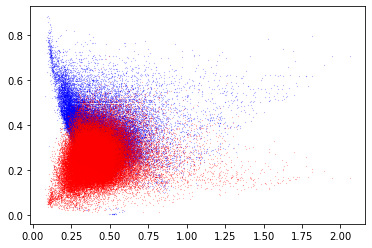

In [25]:
#$$ Строим график зависимости результатов на участках от явки по результатам машинного обучения

plt.scatter(uiks_predicted['turnout_predicted'], uiks_predicted['er_percent_predicted'], color='blue', s=0.01)
plt.scatter(uiks_predicted['turnout_predicted'], uiks_predicted['kprf_percent_predicted'], color='red', s=0.01)
plt.show()

После применения машинного обучения картина больше похожа на ту, что наблюдалась в регионах севера России, где выборы традиционно проходят на высоком уровне. «Расходящиеся хвосты» в области большой явки больше не наблюдаются. Подсчитаем итоговый результат для партии Единая Россия  и КПРФ по результатам полученных данных. Кроме того, установим количество вброшенных голосов:

In [26]:
#%% Считаем итоговый результат после применения машинного обучения

er_real = uiks_predicted['er_predicted'].sum() #12155992.0
kprf_real = uiks_predicted['kprf'].sum() #10610737.0
voted_real = uiks_predicted['voted_predicted'].sum() #40145581.0
er_real_percent = er_real / voted_real #0.3027977
kprf_real_percent = kprf_real / voted_real #0.2643064
fake_voted = uiks_predicted['er'].sum() - uiks_predicted['er_predicted'].sum() #14595980.0

Таким образом, после восстановления результатов с помощью модели машинного обучения Единая Россия набирает около 30 процентов при средней явке 40 процентов. Разница количества голосов за Единую Россию в исходных данных и данных, полученных в результате моделирования составляет 14595980. КПРФ набирает 26 процентов.  Посмотрим, изменился ли состав регионов, в которых лидирует КПРФ:

In [34]:
#%% Таблица регионов, где победила КПРФ после применения машинного обучения

reg_true = pd.DataFrame()
for region in regions:
    region_data = uiks_predicted[uiks_predicted['region'] == region]
    kprf_total = region_data['kprf'].sum()
    er_total = region_data['er_predicted'].sum()
    voted = region_data['voted'].sum()
    kprf_percent = kprf_total / voted
    er_percent = er_total / voted
    uiks_predicted.loc[uiks['region'] == region, 'k-e'] = kprf_percent-er_percent
    uiks_predicted.loc[uiks_predicted['region'] == region, 'color'] = 'blue' if er_total > kprf_total else 'red'
    reg_true = reg_true.append(pd.DataFrame({'name': region,'kprf':[kprf_total],'er':[er_total]}), ignore_index=True)
reg_true[reg_true['kprf']>reg_true['er']]
#len(uiks_predicted['k-e'])

,name,kprf,er
0,Алтайский край,224806,214014.0
14,Кабардино-Балкарская Республика,77074,72990.0
31,Ненецкий автономный округ,4863,4547.0
35,Омская область,190454,174577.0
40,Приморский край,173429,154488.0
43,Республика Алтай,22244,21487.0
52,Республика Марий Эл,89013,71913.0
54,Республика Саха (Якутия),118362,93954.0
63,Сахалинская область,43471,41334.0
73,Ульяновская область,147069,123753.0


Количество регионов, где КПРФ одержала победу над Единой Россией, увеличилось с четырех до семнадцати. Проверим, как изменилась раскраска регионов на карте России:

In [35]:
#%% Карта России с разноцветными участками по результатам машинного обучения

fig = px.scatter_mapbox(uiks_predicted, #our data set
                        lat="lat",
                        lon="lon",
                        color='k-e',
                        range_color = (-0.5, 0.5),
                        zoom=2,
                        width=1200, height=800,
                        center = {'lat':60, 'lon':105},
                        title = 'После машинного обучения')
fig.update_layout(mapbox_style="open-street-map")
fig.update_traces(marker=dict(size=5))
fig.show(config={'scrollZoom': True})

Карта окрасилась в более теплые тона. Во всех регионах результат у партий КПРФ и Единая Россия очень близкий.
В результате моделирования результатов выборов на участках с аномальной явкой можно сделать следующие выводы:
* Разница количества голосов за партию Единая Россия при подсчетах ЦИК и с использованием модели машинного обучения составила более 14 миллионов.
* Результат партии Единая Россия составил около 30%
* Результат партии КПРФ составил 26 %
* Средняя явка составила около 40%
* Количество регионов России, в которых результат КПРФ превзошел результат Единой России, увеличилось с четырех до семнадцати.